# Classical Physics Models

## Contents
- [First Order Linear ODE](#first_order_linear_ODE)
- [Second Order Linear ODE](#second_order_linear_ODE)

## First Order Linear ODE <a id="first_order_linear_ODE" />

__Radioactive Decay of Carbon-14__

```math
f(t,u) = \frac{du}{dt}
```

The Radioactive decay problem is the first order linear ODE problem of an exponential with a negative coefficient, which represents the half-life of the process in question. Should the coefficient be positive, this would represent a population growth equation.

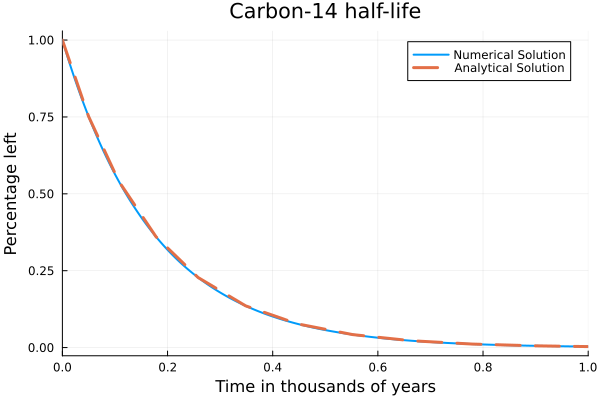

In [1]:
using OrdinaryDiffEq, Plots
gr()

# Half-life of Carbon-14 is 5,730 years.
C₁ = 5.730

# Setup
u₀ = 1.0
tspan = (0.0, 1.0)

# Define the problem
radioactivedecay(u, p, t) = -C₁ * u

# Pass to solver
prob = ODEProblem(radioactivedecay, u₀, tspan)
sol = solve(prob, Tsit5())

# Plot
plot(sol, linewidth = 2, title = "Carbon-14 half-life",
    xaxis = "Time in thousands of years", yaxis = "Percentage left",
    label = "Numerical Solution")
plot!(sol.t, t -> exp(-C₁ * t), lw = 3, ls = :dash, label = "Analytical Solution")

## Second Order Linear ODE <a id="second_order_linear_ODE" />

#### Simple Harmonic Oscillator

Another classical example is the harmonic oscillator, given by:

$$\ddot{x} + \omega^2 x = 0$$

with the known analytical solution

$$\begin{align*}
x(t) &= A\cos(\omega t - \phi) \\
v(t) &= -A\omega\sin(\omega t - \phi),
\end{align*}$$

where

$$A = \sqrt{c_1 + c_2} \qquad\text{and}\qquad \tan \phi = \frac{c_2}{c_1}$$

with $c_1, c_2$ constants determined by the initial conditions such that
$c_1$ is the initial position and $\omega c_2$ is the initial velocity.

Instead of transforming this to a system of ODEs to solve with `ODEProblem`,
we can use `SecondOrderODEProblem` as follows.

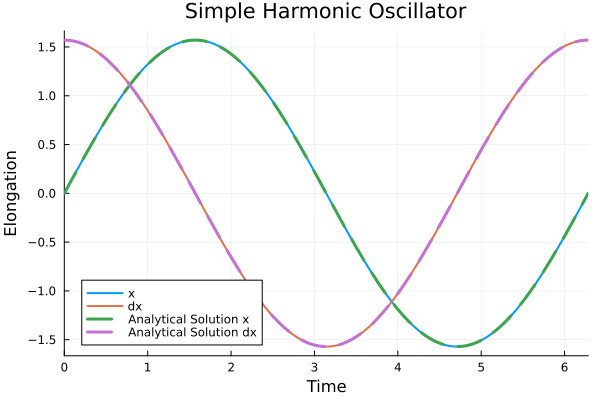

In [2]:
# Simple Harmonic Oscillator Problem
using OrdinaryDiffEq, Plots

# Parameters
ω = 1

# Initial Conditions
x₀ = [0.0]
dx₀ = [π / 2]
tspan = (0.0, 2π)

ϕ = atan((dx₀[1] / ω) / x₀[1])
A = √(x₀[1]^2 + dx₀[1]^2)

# Define the problem
function harmonicoscillator(ddu, du, u, ω, t)
    ddu .= -ω^2 * u
end

# Pass to solvers
prob = SecondOrderODEProblem(harmonicoscillator, dx₀, x₀, tspan, ω)
sol = solve(prob, DPRKN6())

# Plot
plot(sol, idxs = [2, 1], linewidth = 2, title = "Simple Harmonic Oscillator",
    xaxis = "Time", yaxis = "Elongation", label = ["x" "dx"])
plot!(t -> A * cos(ω * t - ϕ), lw = 3, ls = :dash, label = "Analytical Solution x")
plot!(t -> -A * ω * sin(ω * t - ϕ), lw = 3, ls = :dash, label = "Analytical Solution dx")

Note that the order of the variables (and initial conditions) is `dx`, `x`.
Thus, if we want the first series to be `x`, we have to flip the order with `vars=[2,1]`.

## Second Order Non-linear ODE

#### Simple Pendulum

We will start by solving the pendulum problem. In the physics class, we often solve this problem by small angle approximation, i.e. $ sin(\theta) \approx \theta$, because otherwise, we get an elliptic integral which doesn't have an analytic solution. The linearized form is

$$\ddot{\theta} + \frac{g}{L}{\theta} = 0$$

But we have numerical ODE solvers! Why not solve the *real* pendulum?

$$\ddot{\theta} + \frac{g}{L}{\sin(\theta)} = 0$$

Notice that now we have a second order ODE.
In order to use the same method as above, we need to transform it into a system
of first order ODEs by employing the notation $d\theta = \dot{\theta}$.

$$\begin{align*}
&\dot{\theta} = d{\theta} \\
&\dot{d\theta} = - \frac{g}{L}{\sin(\theta)}
\end{align*}$$


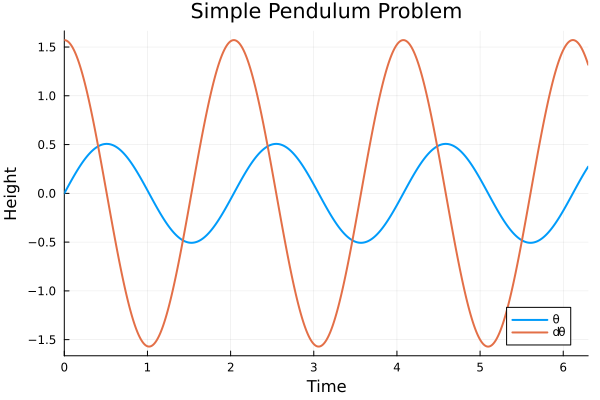

In [3]:
# Simple Pendulum Problem
using OrdinaryDiffEq, Plots

# Constants
const g = 9.81
L = 1.0

# Initial Conditions
u₀ = [0, π / 2]
tspan = (0.0, 6.3)

# Define the problem
function simplependulum(du, u, p, t)
    θ = u[1]
    dθ = u[2]
    du[1] = dθ
    du[2] = -(g / L) * sin(θ)
end

# Pass to solvers
prob = ODEProblem(simplependulum, u₀, tspan)
sol = solve(prob, Tsit5())

# Plot
plot(sol, linewidth = 2, title = "Simple Pendulum Problem", xaxis = "Time",
    yaxis = "Height", label = ["\\theta" "d\\theta"])

Phase space analysis is ubiquitous in the analysis of dynamical systems, and thus we will provide a few facilities for it:

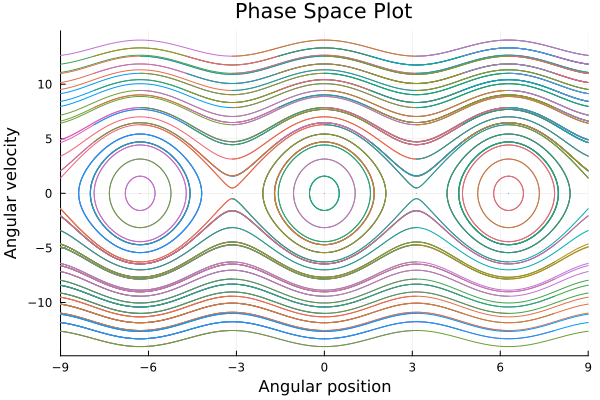

In [4]:
# Initiate phase plot
p = plot(sol, idxs = (1, 2), xlims = (-9, 9), title = "Phase Space Plot",
    xaxis = "Angular position", yaxis = "Angular velocity", leg = false)

# Define function for solving problem and drawing corresponding phase plot
function phase_plot(prob, u0, p, tspan = 2pi)
    _prob = ODEProblem(prob.f, u0, (0.0, tspan))
    sol = solve(_prob, Vern9())                         
    plot!(p, sol, idxs = (1, 2))
end

# Iterate through different initial conditions
for i in (-4pi):(pi / 2):(4π)
    for j in (-4pi):(pi / 2):(4π)
        phase_plot(prob, [j, i], p)
    end
end

# Plot the whole thing
plot(p, xlims = (-9, 9))

#### Double Pendulum

A more complicated example is given by the double pendulum. The scaled and simplified equations governing its motion are given by the following:

$$\frac{d}{dt}
\begin{pmatrix}
\alpha \\ l_\alpha \\ \beta \\ l_\beta
\end{pmatrix}=
\begin{pmatrix}
2\frac{l_\alpha - (1+\cos\beta)l_\beta}{3-\cos 2\beta} \\
-2\sin\alpha - \sin(\alpha + \beta) \\
2\frac{-(1+\cos\beta)l_\alpha + (3+2\cos\beta)l_\beta}{3-\cos2\beta}\\
-\sin(\alpha+\beta) - 2\sin(\beta)\frac{(l_\alpha-l_\beta)l_\beta}{3-\cos2\beta} + 2\sin(2\beta)\frac{l_\alpha^2-2(1+\cos\beta)l_\alpha l_\beta + (3+2\cos\beta)l_\beta^2}{(3-\cos2\beta)^2}
\end{pmatrix}$$


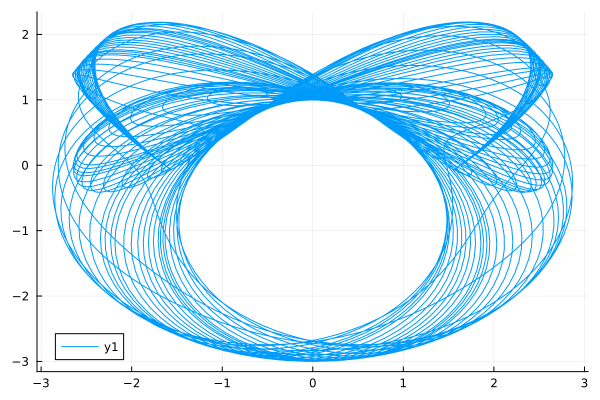

In [5]:
# Double Pendulum Problem
using OrdinaryDiffEq, Plots

# Constants and setup
const m₁, m₂, L₁, L₂ = 1, 2, 1, 2
initial = [0, π / 3, 0, 3pi / 5]
tspan = (0.0, 50.0)

# Convenience function for transforming from polar to Cartesian coordinates
function polar2cart(sol; dt = 0.02, l1 = L₁, l2 = L₂, vars = (2, 4))
    t_vec = sol.t[1]:dt:sol.t[end]

    p1 = l1 * map(x -> x[vars[1]], sol(t_vec).u)
    p2 = l2 * map(y -> y[vars[2]], sol(t_vec).u)

    x1 = l1 * sin.(p1)
    y1 = l1 * -cos.(p1)
    (t_vec, (x1 + l2 * sin.(p2),
        y1 - l2 * cos.(p2)))
end

# Define the Problem
function double_pendulum(xdot, x, p, t)
    xdot[1] = x[2]
    xdot[2] = -((g * (2 * m₁ + m₂) * sin(x[1]) +
                 m₂ * (g * sin(x[1] - 2 * x[3]) +
                  2 * (L₂ * x[4]^2 + L₁ * x[2]^2 * cos(x[1] - x[3])) * sin(x[1] - x[3]))) /
                (2 * L₁ * (m₁ + m₂ - m₂ * cos(x[1] - x[3])^2)))
    xdot[3] = x[4]
    xdot[4] = (((m₁ + m₂) * (L₁ * x[2]^2 + g * cos(x[1])) +
                L₂ * m₂ * x[4]^2 * cos(x[1] - x[3])) * sin(x[1] - x[3])) /
              (L₂ * (m₁ + m₂ - m₂ * cos(x[1] - x[3])^2))
end

# Pass to Solvers
double_pendulum_problem = ODEProblem(double_pendulum, initial, tspan)
sol = solve(double_pendulum_problem, Vern7(), abstol = 1e-10, dt = 0.05);

# Obtain coordinates in Cartesian Geometry
ts, ps = polar2cart(sol, l1 = L₁, l2 = L₂, dt = 0.01)
plot(ps)

The expression 

```julia
map(x -> x[vars[1]], sol(t_vec).u)
```

simply returns a vector of the solution at the times  in `t_vec` for the variable that sits at index `vars[1]`.

#### Poincaré section

In this case, the phase space is 4 dimensional, and it cannot be easily visualized. Instead of looking at the full phase space, we can look at Poincaré sections, which are sections through a higher-dimensional phase space diagram. 

The Poincaré section in this is given by the collection of $(\beta, l_{\beta})$ when $\alpha=0$ and $\frac{d \alpha}{dt} > 0$.

In [6]:
#Constants and setup
using OrdinaryDiffEq
initial2 = [0.01, 0.005, 0.01, 0.01]
tspan2 = (0.0, 500.0)

#Define the problem
function double_pendulum_hamiltonian(udot, u, p, t)
    α = u[1]
    lα = u[2]
    β = u[3]
    lβ = u[4]
    udot .= [2(lα - (1 + cos(β))lβ) / (3 - cos(2β)),
        -2sin(α) - sin(α + β),
        2(-(1 + cos(β))lα + (3 + 2cos(β))lβ) / (3 - cos(2β)),
        -sin(α + β) - 2sin(β) * (((lα - lβ)lβ) / (3 - cos(2β))) +
        2sin(2β) * ((lα^2 - 2(1 + cos(β))lα * lβ + (3 + 2cos(β))lβ^2) / (3 - cos(2β))^2)]
end

# Construct a ContiunousCallback
condition(u, t, integrator) = u[1]
affect!(integrator) = nothing
cb = ContinuousCallback(condition, affect!, nothing,
    save_positions = (true, false))

# Construct Problem
poincare = ODEProblem(double_pendulum_hamiltonian, initial2, tspan2)
sol2 = solve(poincare, Vern9(), save_everystep = false, save_start = false,
    save_end = false, callback = cb, abstol = 1e-16, reltol = 1e-16)

function poincare_map(prob, u₀, p; callback = cb)
    _prob = ODEProblem(prob.f, u₀, prob.tspan)
    sol = solve(_prob, Vern9(), save_everystep = false, save_start = false,
        save_end = false, callback = cb, abstol = 1e-16, reltol = 1e-16)
    scatter!(p, sol, idxs = (3, 4), markersize = 3, msw = 0)
end

poincare_map (generic function with 1 method)

In [ ]:
lβrange = -0.02:0.0025:0.02
p = scatter(sol2, idxs = (3, 4), leg = false, markersize = 3, msw = 0)
for lβ in lβrange
    poincare_map(poincare, [0.01, 0.01, 0.01, lβ], p)
end
plot(p, xlabel = "\\beta", ylabel = "l_\\beta", ylims = (0, 0.03))

#### Hénon-Heiles System

The Hénon-Heiles potential occurs when non-linear motion of a star around a galactic center, with the motion restricted to a plane.